# Pipeline for image size estimation

Imports

In [1]:
import os
from pathlib import Path
import cv2
import json
import matplotlib.pyplot as plt
import random
import numpy as np
from segment_anything import sam_model_registry, SamPredictor

## Step 0: Assign input point to each image

run: 'python3 label.py' to get json of image names and input points (change path to folder in script)

## Step 1: Load image data from json

In [2]:
# path to json file
json_file = 'red_lasers/im_data.json'

# folder containing images
image_folder = 'red_lasers/sample_data'

# load data
with open(json_file, 'r') as file:
    image_data = json.load(file)

Some helper functions for displaying images

In [3]:
# function to show mask
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# function to show input point
def show_points(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='blue', marker='*', s=250, edgecolor='white', linewidth=1.25)

### let's visualize labels from json

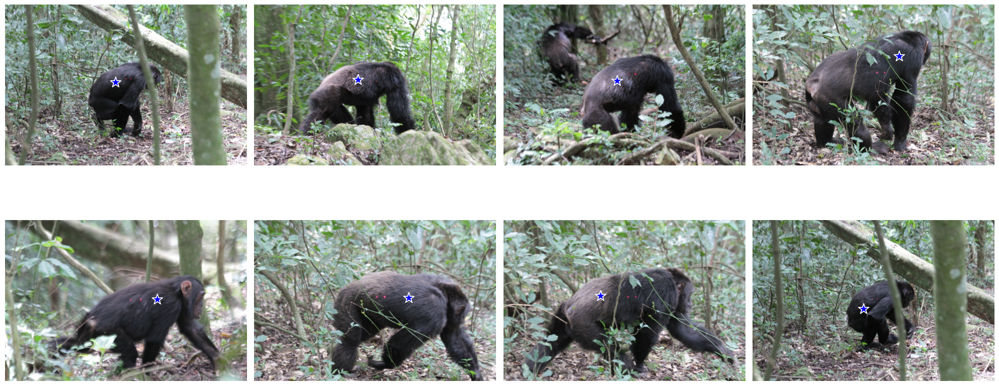

In [4]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Looks good!

## Step 2: Run images through SAM to prep for laser detection

### ***only need to run this code once to get masks!!!

Set up SAM

In [5]:
# select checkpoint and model type
sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# define predictor
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)

In [6]:
def generate_mask(im, input_point):
    input_label = np.array([1])
    predictor.set_image(im)
    masks, scores, _ = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True)
    # return best mask
    return masks[np.argmax(scores)]

Iterate through images and get mask

In [7]:
# paths
mask_folder = 'red_lasers/sample_data_masks'

# Ensure mask folder exists
os.makedirs(mask_folder, exist_ok=True)

In [18]:
# iterate through each entry in the JSON data
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])
        # Generate the mask
        mask = generate_mask(img, input_point)
        mask = mask.astype(np.uint8)
        
        # Define the mask filename
        mask_filename = os.path.splitext(image_name)[0] + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_filename)
        
        # Save the mask
        cv2.imwrite(mask_path, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['mask'] = mask_filename

# Write the updated JSON data to a file
with open(json_file, 'w') as file:
    json.dump(image_data, file, indent=4)

print(f"Updated data saved to {json_file}")

[W NNPACK.cpp:53] Could not initialize NNPACK! Reason: Unsupported hardware.


Updated data saved to red_lasers/im_data.json


### let's checkout the results

In [8]:
# Load the JSON data
with open(json_file, 'r') as up_file:
    image_data = json.load(up_file)


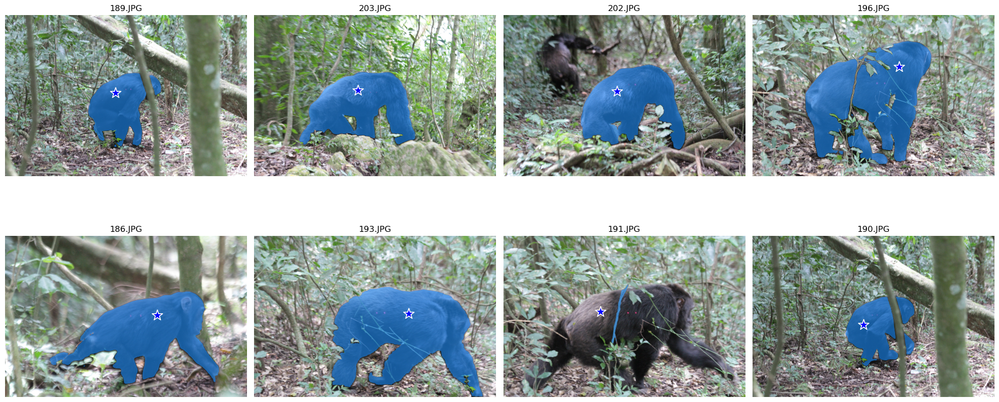

In [9]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = im_data['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        show_mask(mask, axs[idx])
        axs[idx].axis('off')
        axs[idx].set_title(image_name)

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Good stuff

## Step 3: laser point detection

In [12]:
import laser_detection as ld
import importlib
importlib.reload(ld)

<module 'laser_detection' from '/Users/jbrandinger/Documents/DS Capstone/fuzzy-wuzzy/laser_detection.py'>

In [13]:
idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    source = cv2.imread(image_path)

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    mask = mask > 0  # need to convert to boolean values

    if source is not None:
        # run laser detection image
        points = ld.detect_laser_points(source, mask)
        if len(points) < 2:
            print("Less than two lasers detected. Retrying without mask...")
            points = ld.detect_laser_points(source, np.ones(source.shape, dtype=bool))
            print(f"Detected {len(points)} points without mask")
        
        # Update the JSON data with the mask filename
        image_data[image_name]['laser_points'] = points

# Write the updated JSON data to a file
with open(json_file, 'w') as file:
    json.dump(image_data, file, indent=4)

print(f"Updated data saved to {json_file}")

Less than two lasers detected. Retrying without mask...
Detected 2 points without mask
Updated data saved to red_lasers/im_data.json


let's checkout the results

In [14]:
def draw_dots(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='yellow', s=5)


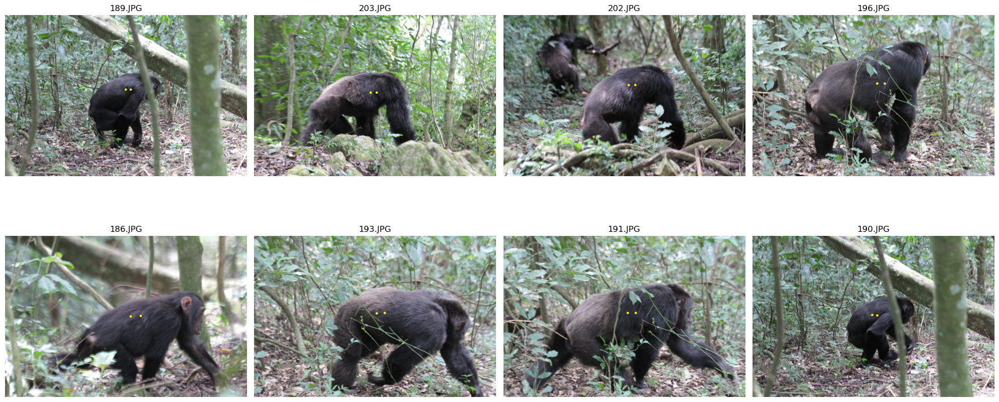

In [15]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        # extract coordinates
        points = np.array(info['laser_points'])

        # plot image
        axs[idx].imshow(img)
        if len(points != 0):
            draw_dots(points, axs[idx])
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No lasers detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 4: Run VitPose